# **<h3 align="center"> Big Data Analytics - Project </h3>**
# **<h3 align="center">Stock Sentiment</h3>**
### **<h3 align="center">Prediction market behavior from US News Notebook</h3>**

**Group _ members:**<br>
Alexandra Pinto - 20211599@novaims.unl.pt - 20211599<br>
Steven Carlson - 20240554@novaims.unl.pt - 20240554<br>
Sven Goerdes - 20240503@novaims.unl.pt - 20240503<br>
Tim Straub - 20240505@novaims.unl.pt - 20240505<br>

# Table of Contents
1. Introduction  
2. Necessary Extensions and Imports
3. News Data Pipeline  
   - 3.1 Ingest and Inspect News Data  
   - 3.2 Group Articles by Day and Topic  
   - 3.3 TF-IDF Feature Extraction  
   - 3.4 Sentiment Analysis Using BERT  
4. News Data Pipeline   
5. Exploratory Data Analysis (EDA)  
6. Machine Learning  
7. Predictive Modeling  
8. Insights and Conclusions






# 1. Introduction

In this notebook, we analyze news articles from the New York Times over a 1-year period (April 2024 to April 2025). Our goal is to extract topic-specific features from headlines using TF-IDF and correlate them with market behavior (specifically, the SPY stock index). The main steps include:

- Pulling and storing NYT and SPY stock data
- Preprocessing and grouping headlines by topic and day
- Computing daily TF-IDF vectors per topic
- Generating pivot tables of article counts and TF-IDF values
- Joining with stock market data for correlation analysis


# 2. Necessary Extensions and Imports

In this section, we install any required extensions and import the necessary libraries to support the operations throughout the notebook, including data ingestion, processing, and analysis.



In [0]:
# Upgrade typing_extensions to a version MLflow expects
%pip install --upgrade typing_extensions

%pip install alpaca_trade_api

# Install (or reinstall) MLflow
%pip install --upgrade mlflow

#Since we decided to use XGBoost as an ml algorithm we need to also install
%pip install xgboost

# Restart the Python process so the new packages take effect
dbutils.library.restartPython()


import requests, json
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, month, dayofmonth, hour

from pyspark.sql import functions as F
from pyspark.sql.functions import to_timestamp, col, concat_ws, collect_list, count, window
from pyspark.ml import Pipeline
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, HashingTF, IDF
from pyspark.ml import PipelineModel

import alpaca_trade_api as tradeapi
from alpaca_trade_api.rest import REST
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth


Python interpreter will be restarted.
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.1.1
    Not uninstalling typing-extensions at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed571329-5f82-4dce-9dfb-70a669d9de83
    Can't uninstall 'typing-extensions'. No files were found to uninstall.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
  Attempting uninstall: requests
    Found existing installation: requests 2.27.1
    Not uninstalling requests at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed571329-5f82-4dce-9dfb-70a669d9de83
    Can't uninstall 'requests'. No files were found to uninstall.
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.0.1
    Not uninstalling markupsaf

# 3. News Data Pipeline  

In the following cells, we will load and inspect the NYT headlines dataset
We start by reading the cleaned and partitioned news data from the Delta table `nyt_archive`.

It is also important to understand our use of first Delta and then Hive.
| Step                  | Component        | Purpose                                                                                                |
| --------------------- | ---------------- | ------------------------------------------------------------------------------------------------------ |
| **1. Save data**      | **Delta format** | Efficient, ACID-compliant storage of large datasets. We write the table with this format.                  |
| **2. Register table** | **Hive table**   | Adds a logical name (`nyt_archive`) to the Delta data so we can query it with SQL or `spark.table()`. |

We use Delta to store the data efficiently and Hive to make it easy to access and query. It’s the combination that gives us both performance and usability.

## 3.1. Ingest and Inspect News Data




In [0]:
# =============================
# NYTimes Archive Ingestion
# =============================

API_KEY     = "9cLqd9jAufochxZTdf3XW0MVh4mvzGIO"
BASE_URL    = "https://api.nytimes.com/svc/archive/v1"
DELTA_PATH  = "/mnt/nyt/archive_yearly_delta"   # final Delta store

# Importing required libraries
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, month, dayofmonth, hour
import requests
import json


# Let's Initialize Spark
spark = SparkSession.builder.getOrCreate()

# We define that the date range will: April 2024 → April 2025
start_year, start_month = 2024, 4
end_year,   end_month   = 2025, 4

months = []
y, m = start_year, start_month
while (y < end_year) or (y == end_year and m <= end_month):
    months.append((y, m))
    m += 1
    if m == 13:
        m = 1
        y += 1

# Loop and append each month’s headlines to Delta 
for y, m in months:
    url    = f"{BASE_URL}/{y}/{m}.json"
    params = {"api-key": API_KEY}

    resp = requests.get(url, params=params)
    resp.raise_for_status()
    docs = resp.json().get("response", {}).get("docs", [])
    if not docs:
        continue

    # parallelize & read JSON
    rdd = spark.sparkContext.parallelize([json.dumps(d) for d in docs])
    df  = spark.read.json(rdd)

    # Select only the relevant fields for analysis:
    # - 'headline': used for text analysis (TF-IDF, topic modeling)
    # - 'pub_date': used to align news with stock market timestamps
    # - 'section_name' (renamed as 'topic'): serves as a proxy for the topic/category of each article, we will also use this later to check if there is any correlation between topics and the target
    df_sel = df.select(
        col("headline.main").alias("headline"),
        col("pub_date").alias("pub_date"),
        col("section_name").alias("topic")
    )

    # add partition columns
    df_part = df_sel.withColumn("yr", year("pub_date")) \
                    .withColumn("mo", month("pub_date")) \
                    .withColumn("dy", dayofmonth("pub_date")) \
                    .withColumn("hr", hour("pub_date"))

    # write into Delta (append mode), partitioned
    df_part.write \
           .format("delta") \
           .mode("append") \
           .partitionBy("yr","mo","dy","hr") \
           .save(DELTA_PATH)

# 4) Register as a Hive table for easy querying
spark.sql(f"""
  CREATE TABLE IF NOT EXISTS nyt_archive
  USING DELTA
  LOCATION '{DELTA_PATH}'
""")

Out[6]: DataFrame[]

Now let's check the dataset.

In [0]:
# Verify by reading & displaying a sample
news_df = spark.table("nyt_archive")
display(news_df.limit(20))

headline,pub_date,topic,yr,mo,dy,hr
"Breast Cancer Continues to Rise Among Younger Women, Study Finds",2024-10-01T12:00:12+0000,Health,2024,10,1,12
"Weekly Student News Quiz: Lebanon, Batman, Baby Hippo",2024-10-01T12:03:59+0000,The Learning Network,2024,10,1,12
"A Tense, Policy-Heavy Debate Ends With Clash Over Democracy",2024-10-01T12:06:56+0000,U.S.,2024,10,1,12
"Eurozone Inflation Slows to 1.8%, Bolstering Bets on Faster Rate Cuts",2024-10-01T12:18:17+0000,Business Day,2024,10,1,12
SoftBank’s Masa Son Nears His Next Big Bet: OpenAI,2024-10-01T12:28:23+0000,Business Day,2024,10,1,12
New Children’s Museum of Manhattan to Open in 2028,2024-10-01T12:51:19+0000,Arts,2024,10,1,12
"After Warm Welcome in Asia, Pope Francis Gets a Fraught Reception in Belgium",2024-10-01T12:51:40+0000,World,2024,10,1,12
Israel Has Invaded Lebanon Three Times Before. Here’s a Closer Look.,2024-10-01T13:15:16+0000,World,2024,10,1,13
What to Know About JD Vance and Project 2025,2024-10-01T13:29:17+0000,U.S.,2024,10,1,13
Biden to Sign Bill Allowing Chip Projects to Skirt Key Environmental Review,2024-10-01T13:41:27+0000,U.S.,2024,10,1,13


## 3.2. Group Articles by Day and Topic 
We tokenize, remove stopwords, apply hashing TF and compute IDF values to get sparse vector representations of topic-specific documents.


In [0]:
# -------------------------------
# Load the archived articles
# -------------------------------
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth

articles = (
    spark
      .table("nyt_archive")                     # your Delta table
      .withColumn("timestamp", to_timestamp(col("pub_date")))
      .select("timestamp", "headline", "topic")
)

# ----------------------------------------------------------
# Group into 24-hour tumbling windows by topic
# ----------------------------------------------------------
grouped = (
    articles
      .groupBy(
         window("timestamp", "24 hours").alias("time_window"),
         col("topic")
      )
      .agg(
         concat_ws(" ", collect_list("headline")).alias("document"),
         count("*").alias("article_count")
      )
      .select(
         col("time_window.start").alias("window_start"),
         col("time_window.end").alias("window_end"),
         "topic",
         "document",
         "article_count"
      )
      .orderBy("window_start", "topic")
)


## 3.2. Compute TF-IDF Features
We tokenize, remove stopwords, apply hashing TF and compute IDF values to get sparse vector representations of topic-specific documents.

In [0]:
# read the table
nyt_df = spark.table("nyt_archive")

# filter for month = 4 (April)
apr_df = nyt_df.filter(col("mo") == 4)
display(apr_df)


headline,pub_date,topic,yr,mo,dy,hr
"She Loves Amalfi, Aperol and Killing Off Her Ex in Fiction",2024-04-25T09:00:13+0000,Books,2024,4,25,9
"Losing a Foot Never Held Her Back, Until She Tried to Join the Military",2024-04-25T09:00:30+0000,U.S.,2024,4,25,9
E.P.A. Severely Limits Pollution From Coal-Burning Power Plants,2024-04-25T09:00:33+0000,Climate,2024,4,25,9
"Letter by Letter, Steve Gleason Typed His Memoir With His Eyes",2024-04-25T09:00:47+0000,Books,2024,4,25,9
Hoping Art Can Strike a Balance on the U.S.-Mexico Border,2024-04-25T09:00:50+0000,Arts,2024,4,25,9
A New Arts Campus Blooms on Detroit’s East Side,2024-04-25T09:01:10+0000,Arts,2024,4,25,9
Music Is More Than Just Sound,2024-04-25T09:01:10+0000,Arts,2024,4,25,9
‘We’re Aware of the Location’: Aid Groups in Gaza Coordinated With I.D.F. but Still Came Under Fire,2024-04-25T09:01:27+0000,World,2024,4,25,9
10 Campus Museums Shine a Spotlight on Democracy,2024-04-25T09:02:16+0000,Arts,2024,4,25,9
Energy Dept. Aims to Speed Up Permits for Power Lines,2024-04-25T09:02:52+0000,Climate,2024,4,25,9


In [0]:
# --------------------------------
# Build the TF-IDF Pipeline
# --------------------------------
from pyspark.sql import functions as F
from pyspark.sql.functions import to_timestamp, col, concat_ws, collect_list, count, window
from pyspark.ml import Pipeline
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, HashingTF, IDF
from pyspark.ml import PipelineModel

tokenizer = RegexTokenizer(inputCol="document", outputCol="words", pattern="\\W+")
stopper   = StopWordsRemover(inputCol="words",    outputCol="filtered")
hashTF    = HashingTF(inputCol="filtered", outputCol="rawFeatures", numFeatures=1<<14)
idf       = IDF(inputCol="rawFeatures", outputCol="tfidfFeatures")

tfidf_pipeline = Pipeline(stages=[tokenizer, stopper, hashTF, idf])

# ------------------------------------------------
# Fit the pipeline and **save** the model
# ------------------------------------------------
tfidf_model = tfidf_pipeline.fit(grouped)
tfidf_model.write().overwrite().save("/mnt/nyt/tfidf_model")

# ------------------------------------------------
#Transform to get TF-IDF features0
# ------------------------------------------------
tfidf_df = tfidf_model.transform(grouped)

# ------------------------------------------------
# Display the TF-IDF output
# ------------------------------------------------
display(
  tfidf_df.select(
    "window_start",
    "window_end",
    "topic",
    "article_count",
    "tfidfFeatures"
  )
)


window_start,window_end,topic,article_count,tfidfFeatures
2024-04-01T00:00:00.000+0000,2024-04-02T00:00:00.000+0000,Arts,24,"Map(indices -> List(178, 307, 322, 338, 628, 1519, 1893, 2176, 2187, 2295, 2396, 2527, 2642, 3002, 3268, 4065, 4857, 4944, 5439, 5809, 6048, 6436, 6946, 7023, 7085, 7208, 7349, 8324, 8353, 8392, 8611, 8892, 9048, 9510, 9616, 9936, 10374, 10570, 10731, 10755, 11526, 11650, 12206, 12409, 12484, 12604, 12716, 12906, 13249, 13658, 13726, 14161, 14235, 14723, 14995, 15152, 15354, 15916), length -> 16384, values -> List(10.391651579637447, 13.230680810459118, 10.780988708655363, 9.479664635807532, 14.322576942063353, 13.609561986431993, 13.496341002483454, 21.705004236690172, 9.379416645048, 14.840415170064334, 15.992291878725936, 14.840415170064334, 16.056810494388827, 11.348246579302852, 17.44084719389669, 18.70941774635679, 15.806665667571675, 18.269607323781166, 15.874021741630273, 9.85127308094589, 22.167456276171947, 16.12274721454515, 13.334139338672626, 22.167456276171947, 13.944936204396345, 11.60311674673075, 14.110724240421494, 7.317632599899949, 15.68900352811183, 21.304410058816604, 8.863124675993715, 15.5207351281587, 9.30980795380901, 16.190165782101328, 20.634979404873974, 22.714420946553812, 12.206771318786483, 8.98410881215463, 7.9457318071890635, 22.562259372078508, 20.349048865461, 9.393534318160238, 16.87669049938787, 11.881667208621138, 13.360571227719092, 20.951060951847452, 16.70998094592344, 9.834834683652012, 24.24689781785178, 25.463293142176276, 16.70998094592344, 17.44084719389669, 13.281964110537018, 16.40201848374319, 16.259134336775425, 10.145456720474535, 13.230680810459118, 13.441293586478864), vectorType -> sparse)"
2024-04-01T00:00:00.000+0000,2024-04-02T00:00:00.000+0000,Books,12,"Map(indices -> List(308, 1198, 1509, 2915, 3411, 3580, 4408, 5841, 6717, 6829, 7555, 8080, 8273, 8677, 9859, 10270, 10928, 11397, 12424, 12426, 12671, 13754, 14692, 15462), length -> 16384, values -> List(12.65420079307639, 8.741133038232025, 7.855402402774953, 16.629976204676954, 10.978351930269373, 25.463293142176276, 14.59027034324718, 14.322576942063353, 12.760973628384498, 8.965647215431495, 11.458858186727838, 15.575782544163289, 12.373997267811188, 17.870256264584686, 8.387151486862937, 14.076825574659692, 8.684740400329517, 19.22496851713677, 15.5207351281587, 11.163978141423636, 20.349048865461, 17.44084719389669, 15.161331528720838, 22.167456276171947), vectorType -> sparse)"
2024-04-01T00:00:00.000+0000,2024-04-02T00:00:00.000+0000,Briefing,12,"Map(indices -> List(338, 1792, 2681, 4324, 5285, 7913, 8323, 9974, 10504, 12186, 12376, 13209, 14680, 14931, 14948, 16059), length -> 16384, values -> List(9.479664635807532, 10.543454619518815, 14.884211568327792, 8.690332200643706, 10.837701172572821, 4.521670296052921, 8.821907148343804, 12.826910348540824, 9.059112718770884, 17.14552697545693, 11.897927411029155, 9.42197055002387, 8.916964605566225, 12.354949584775213, 10.219080047222887, 22.167456276171947), vectorType -> sparse)"
2024-04-01T00:00:00.000+0000,2024-04-02T00:00:00.000+0000,Business Day,33,"Map(indices -> List(189, 274, 275, 372, 1378, 1395, 1434, 1684, 1753, 1792, 1875, 2309, 2618, 2624, 2631, 3053, 3187, 3492, 3493, 3657, 3854, 4175, 4324, 4482, 4688, 4781, 5439, 5510, 5653, 5694, 5703, 6039, 6065, 6068, 6080, 6258, 6459, 6756, 7212, 7419, 7453, 7685, 7913, 8019, 8195, 8735, 9384, 9502, 9511, 9726, 9805, 9859, 10073, 10502, 10570, 10708, 10878, 10889, 10953, 11001, 11042, 11178, 11205, 11402, 11561, 11651, 11673, 11907, 11941, 12167, 12174, 12224, 12263, 12624, 13472, 13638, 14408, 14820, 14931, 15402, 16087, 16138, 16222), length -> 16384, values -> List(9.071797727099446, 20.634979404873974, 20.634979404873974, 16.190165782101328, 17.240773070400675, 12.717807416028199, 8.947298534379186, 12.065568786212527, 14.110724240421494, 10.543454619518815, 25.463293142176276, 11.60311674673075, 19.625562695010338, 16.963653110007627, 6.255055020563518, 16.552049745467173, 13.4963410

## 3.3. Pivot Data for Analysis
We create wide-format tables for both article counts and TF-IDF vectors, which will later be used for correlation analysis.

In [0]:
import re  # For the sanitize() function

from pyspark.sql.functions import (
    col,
    first,
    to_timestamp,
    concat_ws,
    collect_list,
    count,
    window
)
# Helper to make column‐safe names
def sanitize(name: str) -> str:
    # replace non-alphanumeric with underscore, collapse multiple, strip edges
    s = re.sub(r'\W+', '_', name)
    return re.sub(r'_+', '_', s).strip('_')

# Pivot article counts
counts_pivot = (
    tfidf_df
      .groupBy("window_start", "window_end")
      .pivot("topic")
      .agg(first("article_count"))            
)

# Pivot TF-IDF vectors
tfidf_pivot = (
    tfidf_df
      .groupBy("window_start", "window_end")
      .pivot("topic")
      .agg(first("tfidfFeatures"))
)

# Rename columns to more understandable names and add appropriate prefixes
counts_safe = counts_pivot
for col_name in counts_pivot.columns:
    if col_name not in ("window_start", "window_end"):
        safe = sanitize(col_name)
        counts_safe = counts_safe.withColumnRenamed(col_name, f"count_{safe}")

tfidf_safe = tfidf_pivot
for col_name in tfidf_pivot.columns:
    if col_name not in ("window_start", "window_end"):
        safe = sanitize(col_name)
        tfidf_safe = tfidf_safe.withColumnRenamed(col_name, f"tfidf_{safe}")

# Join the two
final_df = counts_safe.join(
    tfidf_safe,
    on=["window_start", "window_end"],
    how="inner"
)

# Persist and register
OUT_PATH = "/mnt/nyt/news_tfidfs"

final_df.write \
    .format("delta") \
    .mode("overwrite") \
    .save(OUT_PATH)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS news_tfidfs
  USING DELTA
  LOCATION '{OUT_PATH}'
""")

Out[20]: DataFrame[]

Let's open the dataset.


In [0]:
# Show schema & sampler
# Display a sample of the data
display(
  final_df.select(
    "window_start",
    "window_end",
    "count_Business_Day",
    "tfidf_Business_Day"
  ).limit(3)
)


## 3.4. Sentiment Analysis Using Bert

Initially, we explored using an external API to retrieve sentiment labels for the news headlines. However, due to technical issues and limited control over the output, we decided to perform sentiment analysis independently using a pre-trained BERT model.

In this step, we apply BERT to assign sentiment scores (e.g., positive, neutral, negative) to each headline. Since we don't have a labeled target to validate the sentiment predictions against, we treat this as an exploratory, unsupervised analysis. The results should be interpreted with caution, but they allow us to experiment with integrating pre-trained models in Databricks and enhance our understanding of the emotional tone of the news data.


In [0]:
### CODE :)

# 4. News Data Pipeline 
We read the daily OHLC data for the SPY index from the table `stock_daily`.


In [0]:
import alpaca_trade_api as tradeapi
from alpaca_trade_api.rest import REST
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth

# ----------------------------
# Pull daily SPY bars
# ----------------------------
client = REST(
    "PKY96P1SK8M1NUKCCYSC",
    "Uf15nvt1cNm61OVbKudbnmwqhW155pr3PtdaB4gR",
    base_url="https://data.alpaca.markets",
    api_version="v2"
)

bars = client.get_bars(
    "SPY",
    tradeapi.TimeFrame(1, tradeapi.TimeFrameUnit.Day),
    start="2024-04-01",
    end="2025-04-30"
)
pdf = bars.df.reset_index().rename(columns={"index": "timestamp"})

# ✅ Keep timestamp column here
stock_df = (
    spark.createDataFrame(pdf)
          .withColumn("timestamp", to_timestamp("timestamp"))
)

# Add partition columns for efficient Delta storage
stock_part = (
    stock_df
      .withColumn("yr", year("timestamp"))
      .withColumn("mo", month("timestamp"))
      .withColumn("dy", dayofmonth("timestamp"))
)

# Save to Delta and register table
DELTA_STOCK_PATH = "/mnt/nyt/stock_daily"

stock_part.write \
    .format("delta") \
    .mode("overwrite") \
    .partitionBy("yr", "mo", "dy") \
    .save(DELTA_STOCK_PATH)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_daily
  USING DELTA
  LOCATION '{DELTA_STOCK_PATH}'
""")
import alpaca_trade_api as tradeapi
from alpaca_trade_api.rest import REST
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth

# ----------------------------
# Pull daily SPY bars
# ----------------------------
client = REST(
    "PKY96P1SK8M1NUKCCYSC",
    "Uf15nvt1cNm61OVbKudbnmwqhW155pr3PtdaB4gR",
    base_url="https://data.alpaca.markets",
    api_version="v2"
)

bars = client.get_bars(
    "SPY",
    tradeapi.TimeFrame(1, tradeapi.TimeFrameUnit.Day),
    start="2024-04-01",
    end="2025-04-30"
)
pdf = bars.df.reset_index().rename(columns={"index": "timestamp"})

# ✅ Keep timestamp column here
stock_df = (
    spark.createDataFrame(pdf)
          .withColumn("timestamp", to_timestamp("timestamp"))
)

# Add partition columns for efficient Delta storage
stock_part = (
    stock_df
      .withColumn("yr", year("timestamp"))
      .withColumn("mo", month("timestamp"))
      .withColumn("dy", dayofmonth("timestamp"))
)

# Save to Delta and register table
DELTA_STOCK_PATH = "/mnt/nyt/stock_daily"

stock_part.write \
    .format("delta") \
    .mode("overwrite") \
    .partitionBy("yr", "mo", "dy") \
    .save(DELTA_STOCK_PATH)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_daily
  USING DELTA
  LOCATION '{DELTA_STOCK_PATH}'
""")


Out[36]: DataFrame[]

Let's open the dataframe.

In [0]:

val = spark.table("stock_daily")
display(val.orderBy("timestamp").limit(10))

timestamp,close,high,low,trade_count,open,volume,vwap,yr,mo,dy
2024-04-01T04:00:00.000+0000,522.16,524.38,520.97,449575,523.83,62477540,522.37037,2024,4,1
2024-04-02T04:00:00.000+0000,518.84,518.98,516.48,570884,518.24,74230308,517.893925,2024,4,2
2024-04-03T04:00:00.000+0000,519.41,520.95,517.665,486600,517.72,59155759,519.744621,2024,4,3
2024-04-04T04:00:00.000+0000,513.07,523.8674,512.755,772269,523.52,96908074,517.902986,2024,4,4
2024-04-05T04:00:00.000+0000,518.43,520.44,514.01,669740,514.46,74546483,517.820377,2024,4,5
2024-04-08T04:00:00.000+0000,518.72,520.18,517.89,443840,519.15,48401702,518.94321,2024,4,8
2024-04-09T04:00:00.000+0000,519.32,520.75,514.35,532493,520.5,68124385,517.391628,2024,4,9
2024-04-10T04:00:00.000+0000,514.12,516.16,512.09,753675,513.48,82652806,513.895741,2024,4,10
2024-04-11T04:00:00.000+0000,518,519.48,512.08,582634,515.68,70099007,516.326992,2024,4,11
2024-04-12T04:00:00.000+0000,510.85,515.815,509.08,767726,514.37,92486785,511.756783,2024,4,12


# 5. Merging News and Stock Data

Before diving into Exploratory Data Analysis (EDA), we need to merge the datasets that we've built so far, specifically, the processed news data (with TF-IDF, article counts, and sentiment) and the stock market data (SPY daily prices). This combined dataset will allow us to explore how different news features relate to market behavior.

The merged dataset will include:
- Time-based alignment (by day)
- News features: article count per topic, TF-IDF vectors, sentiment scores
- Market target variable: daily SPY return or price movement

This step ensures all our features and targets are in one place for analysis and modeling.


In [0]:
## Code :)

In [0]:
print("Duplicate columns:")
print([c for c in final_df.columns if c.lower() == "date"])


Duplicate columns:
['date']


In [0]:
from pyspark.sql.functions import to_date, col

# Load both tables
stock_raw = spark.table("stock_daily")
news_raw = spark.table("news_tfidfs")

# Rename and prepare join keys with unique names
stock_df = stock_raw.withColumn("stock_date", to_date("timestamp"))
news_df = news_raw.withColumn("news_date", to_date("window_start"))

# Perform join using unique temporary keys
merged = stock_df.join(news_df, stock_df.stock_date == news_df.news_date, how="inner")

# Check that `timestamp` still exists before using it again
merged = merged.withColumn("date", col("stock_date"))

# Drop all timestamp-related and join keys
columns_to_drop = [
    "timestamp", "window_start", "window_end", "stock_date", "news_date"
]
final_df = merged.drop(*[c for c in columns_to_drop if c in merged.columns])

# Reorder columns (optional)
stock_cols = ["date", "close", "high", "low", "open", "trade_count", "volume", "vwap"]
other_cols = [c for c in final_df.columns if c not in stock_cols]
final_df = final_df.select(*(stock_cols + other_cols))

# Save & register
OUT_PATH = "/mnt/merged/stock_news_daily"

# Clean existing data to avoid schema merge issues
dbutils.fs.rm(OUT_PATH, recurse=True)

final_df.write \
    .format("delta") \
    .mode("overwrite") \
    .save(OUT_PATH)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_news_daily
  USING DELTA
  LOCATION '{OUT_PATH}'
""")

# Confirm row count
print(f"Merged dataset row count: {final_df.count()}")

# Confirm columns
final_df.printSchema()



Merged dataset row count: 272
root
 |-- date: date (nullable = true)
 |-- close: double (nullable = true)
 |-- high: double (nullable = true)
 |-- low: double (nullable = true)
 |-- open: double (nullable = true)
 |-- trade_count: long (nullable = true)
 |-- volume: long (nullable = true)
 |-- vwap: double (nullable = true)
 |-- yr: integer (nullable = true)
 |-- mo: integer (nullable = true)
 |-- dy: integer (nullable = true)
 |-- count_: long (nullable = true)
 |-- count_Admin: long (nullable = true)
 |-- count_Arts: long (nullable = true)
 |-- count_Automobiles: long (nullable = true)
 |-- count_Books: long (nullable = true)
 |-- count_Briefing: long (nullable = true)
 |-- count_Business_Day: long (nullable = true)
 |-- count_Climate: long (nullable = true)
 |-- count_Corrections: long (nullable = true)
 |-- count_Crosswords_Games: long (nullable = true)
 |-- count_Education: long (nullable = true)
 |-- count_Fashion_Style: long (nullable = true)
 |-- count_Food: long (nullable = tr

In [0]:
%sql
SELECT * FROM stock_news_daily LIMIT 10;

date close high low open trade_count volume vwap yr mo dy count_ count_Admin count_Arts count_Automobiles count_Books count_Briefing count_Business_Day count_Climate count_Corrections count_Crosswords_Games count_Education count_Fashion_Style count_Food count_Headway count_Health count_Homepage count_International_Home count_Lens count_Magazine count_Movies count_New_York count_Obituaries count_Opinion count_Parenting count_Podcasts count_Polls count_Reader_Center count_Real_Estate count_Science count_Smarter_Living count_Special_Series count_Sports count_Style count_T_Brand count_T_Magazine count_Technology count_The_Learning_Network count_The_New_York_Times_Presents count_The_Upshot count_Theater count_Times_Insider count_Travel count_U_S count_Video count_Weather count_Well count_World count_Your_Money count_en_Español tfidf_ tfidf_Admin tfidf_Arts tfidf_Automobiles tfidf_Books tfidf_Briefing tfidf_Business_Day tfidf_Climate tfidf_Corrections tfidf_Crosswords_Games tfidf_Education tfidf_Fashion_Style tfidf_Food tfidf_Headway tfidf_Health tfidf_Homepage tfidf_International_Home tfidf_Lens tfidf_Magazine tfidf_Movies tfidf_New_York tfidf_Obituaries tfidf_Opinion tfidf_Parenting tfidf_Podcasts tfidf_Polls tfidf_Reader_Center tfidf_Real_Estate tfidf_Science tfidf_Smarter_Living tfidf_Special_Series tfidf_Sports tfidf_Style tfidf_T_Brand tfidf_T_Magazine tfidf_Technology tfidf_The_Learning_Network tfidf_The_New_York_Times_Presents tfidf_The_Upshot tfidf_Theater tfidf_Times_Insider tfidf_Travel tfidf_U_S tfidf_Video tfidf_Weather tfidf_Well tfidf_World tfidf_Your_Money tfidf_en_Español 2024-04-02 518.84 518.98 516.48 518.24 570884 74230308 517.893925 2024 4 2 null null 39 null 21 9 18 6 6 12 null 3 15 null 3 null null null 3 null 18 null 24 null 12 null null 6 6 null null 3 12 null 3 3 21 null null null 3 6 105 null null 6 81 null null null null Map(indices -> List(234, 484, 631, 675, 894, 1270, 1344, 1628, 1634, 1753, 1818, 2011, 2073, 2121, 2187, 2322, 2330, 2526, 2642, 2736, 2855, 2871, 2973, 3087, 3191, 3269, 3383, 3657, 3734, 4001, 4040, 4078, 4335, 4421, 4481, 4670, 4708, 4777, 5004, 5377, 6080, 6115, 6118, 6687, 6800, 6891, 6926, 6946, 7009, 7325, 7418, 7764, 7806, 7913, 7922, 8323, 8447, 8533, 8591, 8735, 8788, 8842, 9288, 9389, 9499, 9590, 9733, 9992, 10374, 10755, 10997, 11064, 11422, 11739, 11937, 12117, 12409, 12658, 12906, 13979, 14025, 14235, 14439, 14633, 14648, 15008, 15019, 15201, 15230, 15544, 15630, 15836), length -> 16384, values -> List(15.466679611650665, 21.705004236690172, 19.76884517901129, 13.334139338672626, 19.22496851713677, 15.929131651132439, 21.304410058816604, 20.088014734492113, 11.530120444752159, 14.110724240421494, 14.884211568327792, 10.553853243448273, 23.383851600496442, 18.008573192812275, 9.379416645048, 18.008573192812275, 10.7033503646919, 12.591914818731102, 16.056810494388827, 18.871619410167618, 12.760973628384498, 17.655224085843123, 10.247161375501577, 25.463293142176276, 12.206771318786483, 21.705004236690172, 15.310122352138954, 11.51573192796168, 10.769773742323542, 10.895506429170453, 20.349048865461, 11.361852044799027, 17.88610720925151, 24.24689781785178, 18.70941774635679, 18.55553786319414, 19.22496851713677, 16.056810494388827, 12.760973628384498, 23.383851600496442, 4.652807562772743, 9.289236444630598, 8.98410881215463, 19.22496851713677, 20.634979404873974, 20.349048865461, 15.806665667571675, 13.334139338672626, 24.24689781785178, 20.951060951847452, 15.5207351281587, 9.909527338517194, 10.758600545050594, 4.521670296052921, 19.847886611471502, 8.821907148343804, 20.088014734492113, 15.631858943199745, 16.40201848374319, 6.792589622795285, 11.25469779699279, 20.951060951847452, 25.463293142176276, 15.25970099718981, 12.354949584775213, 12.3931666621075, 10.595811969372493, 16.476096321514305, 12.206771318786483, 22.562259372078508, 16.552049745467173, 14.840415170064334, 14.550534662997118, 15.68900352811183, 24.24689781785178, 18.13625203606866, 11.881667208621138, 1

# 6. Exploratory Data Analysis (EDA)

In this section, we explore the structure and trends of the merged dataset. This includes:

- Volume of news over time
- Most common topics and their evolution
- Sentiment patterns by topic
- Visual correlations between news features and stock movements

This analysis will help us understand whether certain topics or sentiment shifts precede changes in the SPY index.


In [0]:
## Code :)

# 7. Machine Learning

Here, we prepare our dataset for modeling and evaluate the potential of our features to predict market behavior. This includes:

- Feature selection (e.g., TF-IDF, sentiment, topic counts)
- Data splitting (training/test sets)
- Evaluation setup

We explore the predictive signal embedded in the news features before moving to formal modeling.


In [0]:
## CODE :)

In [0]:
#re-imports to keep test seperated
import mlflow
import mlflow.spark
from pyspark.sql.window import Window
from pyspark.sql.functions import lead
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import GBTRegressor
from xgboost.spark import SparkXGBRegressor
from pyspark.ml.evaluation import RegressionEvaluator

# Load the stock-only dataset
stock_only_df = spark.table("stock_daily")

# Add target variable: next-day close
wSpec = Window.orderBy("timestamp")
df = stock_only_df.withColumn("label", lead("close", 1).over(wSpec)).na.drop(subset=["label"])

# Define features from stock data only
stock_features = [
    "open", "high", "low", "close"
]

# Assemble and scale features
assembler = VectorAssembler(inputCols=stock_features, outputCol="raw_features")
scaler    = StandardScaler(inputCol="raw_features", outputCol="features", withMean=True, withStd=True)

# Train-test split
train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# Set up evaluator
evaluator = RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse")


In [0]:
# ----------------------------------------------------
# GBT run
# ----------------------------------------------------
mlflow.spark.autolog()   # enable Spark autologging
with mlflow.start_run(run_name="GBTRegressor") as run:
    gbt = GBTRegressor(featuresCol="features", labelCol="label",
                       maxIter=50, maxDepth=5)
    pipeline_gbt = Pipeline(stages=[assembler, scaler, gbt])
    model_gbt = pipeline_gbt.fit(train_df)
    
    preds_gbt = model_gbt.transform(test_df)
    rmse_gbt = evaluator.evaluate(preds_gbt)
    mlflow.log_metric("rmse", rmse_gbt)
    print(f"GBT RMSE = {rmse_gbt:.4f}")

# ----------------------------------------------------
# XGBoost run
# ----------------------------------------------------
# no need to call autolog again—the same setting applies
with mlflow.start_run(run_name="XGBRegressor") as run:
    xgb = SparkXGBRegressor(
        features_col="features",
        label_col="label",
        objective="reg:squarederror",
        num_round=100,
        max_depth=5,
        eta=0.1
    )
    pipeline_xgb = Pipeline(stages=[assembler, scaler, xgb])
    model_xgb = pipeline_xgb.fit(train_df)
    
    preds_xgb = model_xgb.transform(test_df)
    rmse_xgb = evaluator.evaluate(preds_xgb)
    mlflow.log_metric("rmse", rmse_xgb)
    print(f"XGB RMSE = {rmse_xgb:.4f}")


2025/05/26 23:06:42 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.


GBT RMSE = 10.8265


2025-05-26 23:09:48,246 INFO XGBoost-PySpark: _fit Running xgboost-2.1.4 on 1 workers with
	booster params: {'objective': 'reg:squarederror', 'device': 'cpu', 'max_depth': 5, 'num_round': 100, 'eta': 0.1, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2025-05-26 23:10:11,183 INFO XGBoost-PySpark: _fit Finished xgboost training!


XGB RMSE = 8.2256



=== GBTRegressor Metrics ===
MAE : 7.0959
RMSE: 10.8265
R2  : 0.8890

=== XGBRegressor Metrics ===
MAE : 6.1625
RMSE: 8.2256
R2  : 0.9359


/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field raw_features. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)
/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field raw_features. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: Vector

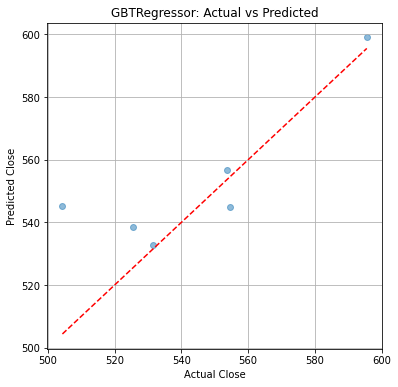

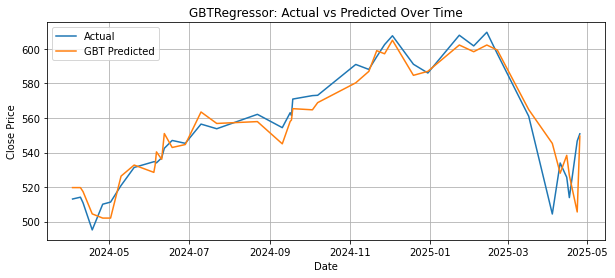

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, expr, avg, sum as spark_sum
from pyspark.sql import DataFrame

def compute_metrics(preds: DataFrame, model_name: str):
    # Add residual column
    preds = preds.withColumn("residual", col("prediction") - col("label"))
    
    # MAE and RMSE
    metrics_row = preds.select(
        expr("avg(abs(residual))").alias("MAE"),
        expr("sqrt(avg(residual * residual))").alias("RMSE")
    ).first()
    mae  = metrics_row["MAE"]
    rmse = metrics_row["RMSE"]
    
    # R2: compute mean(label) first
    mean_label = preds.select(avg("label")).first()[0]
    
    # SSE and SST
    sse = preds.select(spark_sum((col("label") - col("prediction"))**2)).first()[0]
    sst = preds.select(spark_sum((col("label") - mean_label)**2)).first()[0]
    r2  = 1 - sse / sst if sst != 0 else None
    
    print(f"\n=== {model_name} Metrics ===")
    print(f"MAE : {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2  : {r2:.4f}" if r2 is not None else "R2: undefined (zero variance in labels)")
    
    return preds

preds_gbt = compute_metrics(preds_gbt, "GBTRegressor")
preds_xgb = compute_metrics(preds_xgb, "XGBRegressor")

# Sample down for plotting
sample_gbt = preds_gbt.sample(fraction=0.2, seed=42).toPandas()
sample_xgb = preds_xgb.sample(fraction=0.2, seed=42).toPandas()

# Actual vs Predicted scatter
for df, name in [(sample_gbt, "GBTRegressor")]:
    plt.figure(figsize=(6,6))
    plt.scatter(df["label"], df["prediction"], alpha=0.5)
    mn, mx = df["label"].min(), df["label"].max()
    plt.plot([mn, mx], [mn, mx], "r--")
    plt.title(f"{name}: Actual vs Predicted")
    plt.xlabel("Actual Close")
    plt.ylabel("Predicted Close")
    plt.grid()
    plt.show()

# Time-series overlay
if "timestamp" in preds_gbt.columns:
    ts_pd = preds_gbt.select("timestamp","label","prediction") \
        .orderBy("timestamp") \
        .toPandas()
    plt.figure(figsize=(10,4))
    plt.plot(ts_pd["timestamp"], ts_pd["label"], label="Actual")
    plt.plot(ts_pd["timestamp"], ts_pd["prediction"], label="GBT Predicted")
    plt.title("GBTRegressor: Actual vs Predicted Over Time")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# 8. Predictive Modeling

In this section, we implement machine learning models to predict the target variable (e.g., SPY return direction). We focus on:

- XGBoost model training
- Feature importance analysis
- Model performance evaluation (e.g., accuracy, precision, ROC-AUC)

The goal is to identify which news-driven features are most predictive of market movement.


In [0]:
# CODE

In [0]:
from pyspark.ml.regression import GBTRegressor
from xgboost.spark import SparkXGBRegressor

# Enable MLflow autologging
mlflow.spark.autolog()

# --- GBT MODEL ---
with mlflow.start_run(run_name="GBT_Stock_Only") as run:
    gbt = GBTRegressor(featuresCol="features", labelCol="label", maxIter=50, maxDepth=5)
    pipeline_gbt = Pipeline(stages=[assembler, scaler, gbt])
    model_gbt = pipeline_gbt.fit(train_df)

    preds_gbt = model_gbt.transform(test_df)
    rmse_gbt = evaluator.evaluate(preds_gbt)
    mlflow.log_metric("rmse", rmse_gbt)
    print(f"✅ GBT RMSE (Stock-Only): {rmse_gbt:.4f}")

# --- XGBOOST MODEL ---
with mlflow.start_run(run_name="XGB_Stock_Only") as run:
    xgb = SparkXGBRegressor(
        features_col="features",
        label_col="label",
        objective="reg:squarederror",
        num_round=100,
        max_depth=5,
        eta=0.1
    )
    pipeline_xgb = Pipeline(stages=[assembler, scaler, xgb])
    model_xgb = pipeline_xgb.fit(train_df)

    preds_xgb = model_xgb.transform(test_df)
    rmse_xgb = evaluator.evaluate(preds_xgb)
    mlflow.log_metric("rmse", rmse_xgb)
    print(f"✅ XGBoost RMSE (Stock-Only): {rmse_xgb:.4f}")


2025/05/26 23:38:31 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.


✅ GBT RMSE (Stock-Only): 10.8265


2025-05-26 23:41:18,472 INFO XGBoost-PySpark: _fit Running xgboost-2.1.4 on 1 workers with
	booster params: {'objective': 'reg:squarederror', 'device': 'cpu', 'max_depth': 5, 'num_round': 100, 'eta': 0.1, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2025-05-26 23:41:39,409 INFO XGBoost-PySpark: _fit Finished xgboost training!


✅ XGBoost RMSE (Stock-Only): 8.2256


## 9. Insights and Conclusions

We wrap up the notebook with a summary of key takeaways, including:

- Which topics or sentiment patterns were most impactful
- Whether TF-IDF or sentiment contributed more predictive power
- Business or market relevance of findings
- Limitations of the analysis (e.g., no ground-truth sentiment labels, time granularity)
- Ideas for future work (e.g., real-time pipeline, fine-tuned sentiment models)

This section helps contextualize the value of the analysis and where it could go next.


In [0]:
# code :)